### Integrantes :  
- $Adrian Carrillo$
- $Ivan Lafarga$

<img style="float: right; margin: 0px 0px 15px 15px;" src=" https://i.gifer.com/g0HJ.gif" width="300px" height="100px" />


# Proyecto Fractal "Julia".  
### [Fractales Aleatorios](https://www.xatakaciencia.com/matematicas/que-son-los-fractales-y-como-se-construyen)  
>Realizacion de fractal del set "Julia" que muestra auto-similaridad, en un sentido téctico, en todas sus escalas. 
El proyecto es un problema que se puede modelar con las herramientas vistas en el módulo.Es un gráfico o cantidad que en función de su escala en un eje logarítmico da una línea recta, cuya pendiente es su "dimensión fractal".
El objeto muestra el mismo "tipo" de estructura en todas las escalas.

#  Objetivos.
> - En este trabajo nos profundizamos un poco más para conocer más a fondo un tema visto en clase llamado Fractales Aleatorios donde realizamos diferentes ejemplos de los vistos en clase para conocer más a fondo como se comportan y se componen estos fractales por medio de matematicas que demuestran auto-similaridad de comportamiento que al graficarlos nos da una figura con estructuras repetidas que forman en si una estructrura misma , con esto pudimos modificar la parte matematica para crear diferentes "Fractales" y modificando sus estructuras daremos a presentar el mejor en este proyecto para hablar sobre su composicion matematica y Grafica mostrandolo de manera visual.
> ####  Objetivo general.
>  - Se pone en práctica un tema visto en clase para darle una solución y profundizar el tema de interés de los alumnos  
>  - Comprensión del tema y el manejo de la esctructura matematica asi como la composición de un objeto fractal para su exposición en clase trabajado en el lenguaje Python, usando el IDE Jupyter.

> ####  Objetivos específicos
> - Realizar una composición matematica que muestre auto-similaridad de su estructura en la escala en un eje logarítmico da una línea recta, cuya pendiente es su "dimensión fractal" para interpretar su estructura matematica y representarla de manera visual. 
> - El objetivo es crear una animacion al manipular la estructura matematica del fractal conocido como "Julia set" para poder realizar graficamente una figura de nuestro interés no antes vista en clase con figuras llamativas para mostrar la complejidad del tema.

### 2.3 Modelo que representa el problema.

> - El conjunto de Julia es un conjunto definido a partir de una función. Un sistema muy popular es aquel dado por la familia de polinomios cuadráticos complejos que pueden ser expresados como:
$$
f_c(z)=z^2+c
$$
> donde c es un parámetro complejo. 
> Teniendo en cuenta que un número imaginario puede ser descrito como una suma de senos y cosenos, es decir, $e^{ix}=\cos(x)+i\sin(x)$, podemos representar el conjunto de Julia de la forma:
$$
f_c(z)=z^2+\cos(x)+i\sin(x)
$$

> - Se fija el valor de c, y se itera hasta obtener una convergencia de la secuencia. Dicho de otra manera, dado un valor de c, se checa la condicion $\lvert z \rvert<4$ Los números que cumplen dicha condicion pertenecen al conjunto de julia, y se dice que convergen. Los que no, divergen.

### 2.4 Solución del problema de optimización.

In [3]:
for name in dir():
    if not name.startswith('_'):
        del globals()[name]

In [56]:
import numpy  as np
import matplotlib.pyplot as plt
from IPython.display import HTML, Image

### 2.4.1 Definicion del set de julia

In [5]:
def julia(zx, zy, cx, cy, iteraciones):
    z=complex(zx, zy) #condiciones iniciales de z
    c=complex(cx, cy) #condiciones iniciales de c
    
    for i in range(iteraciones):
        z=z**2+c
        if abs(z) > 20:  # Si z excede el limite preestablecido...
            return i    #regresa el numero de iteracion en el que sucedio
        
    return iteraciones - 1  #si eso no sucede, c pertenece al set de julia

### 2.4.2 Realizar la iteracion

In [6]:
xmin, ymin = -2,-2 #valores minimos de x y y
ancho, alto= 4,4 #ancho y alto de la region de interes
xmax, ymax = xmin+ancho, ymin+alto #valores maximos de x y y
ppi=160 #pixeles por unidad
num_x, num_y=ancho*ppi, alto*ppi #numero de valores a darle al arreglo de x
re=np.linspace(xmin, xmax, num_x)
im=np.linspace(ymin, ymax, num_y)
X = np.zeros((len(re), len(im)))  #realizar un arreglo vacio de las dimensiones necesarias

In [69]:
iteraciones=60 #numero maximo de iteraciones
#representando c como c = r*cos(x) + i*r*sin(x) = r*e^(i*x)
r = .77 #r es constante, puede ser variada para obtener varias visualizaciones
x = 3 * np.pi / 4. #valor de x
cx, cy = r * np.cos(x), r * np.sin(x) #se calculan los valores complejos de c

In [70]:
# llenar X con los resultados de la iteracion
for i in range(len(re)):
    for j in range(len(im)):
        X[i, j] = julia(zx=re[i], zy=im[j], cx=cx, cy=cy, iteraciones=iteraciones)

> - En este punto, la matriz de X contiene ya los valores que pertenecen al set de julia y los que no. Ahora, para visualizar, lo que hacemos es darle un color a cada numero.

### 2.5 Visualización de la solución del problema.

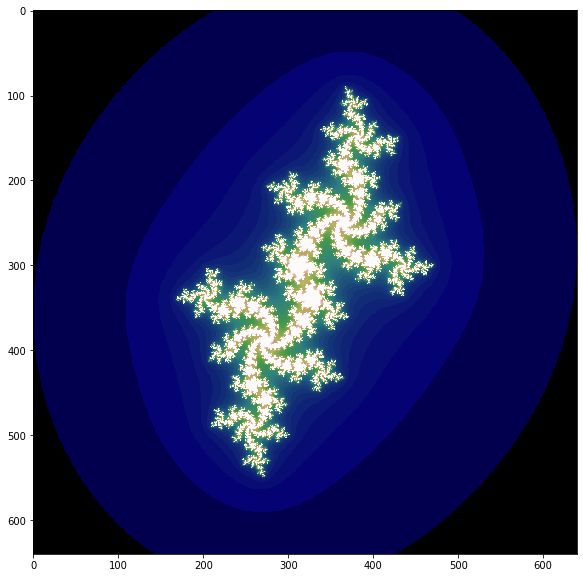

In [71]:
fig= plt.figure(figsize=(10, 10))  # iniciar la figura
ax = plt.axes()  # iniciar los axes
plot=ax.imshow(X, cmap='gist_earth') #graficar los resultados

> - Para obtener una mejor visualización de cómo cambia el conjunto de julia para varios valores de c, realizamos una animación utilizando la función FuncAnimation.

In [22]:
from matplotlib.animation import FuncAnimation

> Los dos cambios principales al código son que ahora necesitamos un rango de x en el cual calcular, así como un número de cuadros para completar dicho rango. 

In [76]:
cuadros=120 #numero de cuadros para completar el rango de a
x = np.linspace(1, 2*np.pi-1, cuadros) #rango mas interesante

> La función requiere especificar la figura predefinida en la cual se graficarán los conjuntos de Julia.

In [77]:
#funcion inicial
def init_func(): 
    fig = plt.figure(figsize=(10, 10)) #se crea la figura
    ax = plt.axes()
    X = np.empty((len(re), len(im)))  #se crea el arreglo inicial

> También se requiere una función que contenga la información requerida para graficar cada cuadro.

In [78]:
def animacion(i):
    cx, cy = r * np.cos(x[i]), r * np.sin(x[i]) #se define c compleja
    for i in range(len(re)):
        for j in range(len(im)):
            X[i, j] = julia(zx=re[i], zy=im[j], cx=cx, cy=cy, iteraciones=iteraciones) #se itera sobre la funcion julia

    plot=ax.imshow(X, cmap='gist_earth') #se grafica
    return [plot]

Advertencia: Al correr este codigo, tarda mucho realizar la animacion. Para ello adjuntamos el archivo generado como .gif.
Sin embargo, se puede correr al remover las comillas

In [ ]:
'''
anim = FuncAnimation(fig, animacion, init_func=init_func,frames=cuadros, interval=50) #se corre la funcion de animacion
anim.save('julia.gif', writer='pillow') #se guarda la animacion
plt.close()
Image(url='julia.gif') #se muestra la animacion
'''

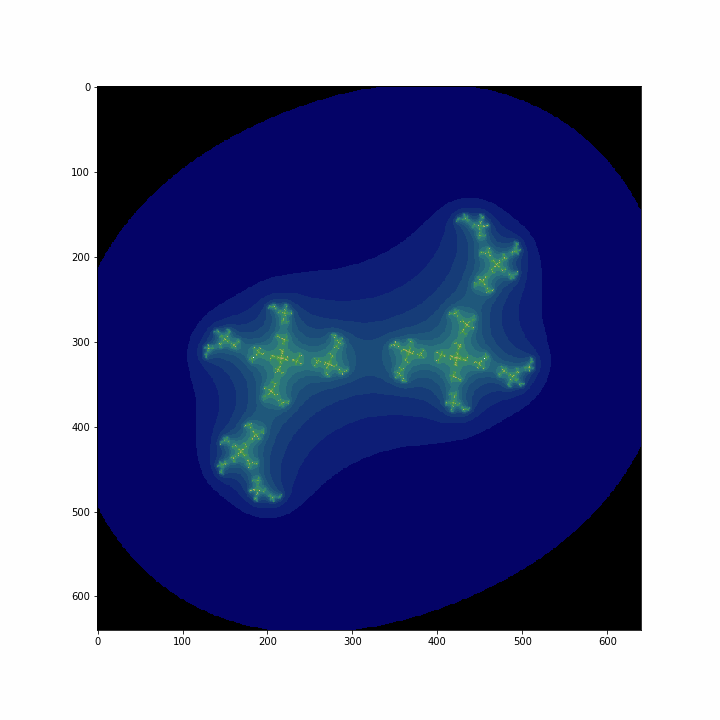

### 2.6 Conclusiones.
> En este trabajo aplicamos y profundizamos los conocimientos vistos en clase en cuanto a fractales. Hemos visto como realizar una animación de un conjunto Julia, definido por una función, y utilizamos la librería matplotlib para graficar y animar el resultado.

> Aprendimos también una forma diferente de graficar fractales. Durante el curso visualizamos los fractales al asignar un punto para cada posición, pero en este caso utilizamos la función imshow, que muestra la imagen como una imagen en pseudocolor.

###  Referencias
> - https://en.wikipedia.org/wiki/Julia_set
> - https://reasonabledeviations.com/2017/09/03/python-julia-set/
> - https://matplotlib.org/matplotblog/posts/animated-fractals/